In [1]:
import pandas as pd
import os
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from dotenv import load_dotenv
load_dotenv()
PATH = (os.environ.get('P'))


In [2]:
#change dir to path 
os.chdir(PATH)
from utils import tokenize_vietnamese, tokenize_text_Np, is_vietnamese, tokenize_english

In [3]:
file_path = PATH + '/modules/spotify/spotify - episodes_details - 49055 records.csv'
df = pd.read_csv(file_path)
df.head()

,episode_id,name,duration_ms,release_date,description,spotify,youtube,channel,show_name
0,3Ow7fvyrs8OX1avRY7xNoG,SS3E13 Khi mình đủ dũng cảm để nói về mối quan hệ,1541276,2023-07-16,Quá trình sản xuất Podcast Mùa 3 về Mối quan h...,https://open.spotify.com/show/3KAOtwtuHrBznKxk...,https://www.youtube.com/@ThePresentWriter,"Chi Nguyen, PhD.",The Present Writer
1,3uF1GZruXo1ZvzNHQibTh5,"SS3E12 ""Yêu tiền"" khác với ""Tham tiền""",2469067,2023-07-09,"Dù ta có thích hay không, tiền là một phần khô...",https://open.spotify.com/show/3KAOtwtuHrBznKxk...,https://www.youtube.com/@ThePresentWriter,"Chi Nguyen, PhD.",The Present Writer
2,6fgmYEz8mqcDAjjhGg6t1E,SS3E11 Có nên ước muốn cho thời gian trở lại?,1609743,2023-07-02,"""Nếu có ước muốn trong cuộc đời này, hãy nhớ ư...",https://open.spotify.com/show/3KAOtwtuHrBznKxk...,https://www.youtube.com/@ThePresentWriter,"Chi Nguyen, PhD.",The Present Writer
3,2VNqtGkyUmzE5b5IZ1IAMr,"SS3E10 Làm sao để bớt ""ngột ngạt"" trong các mố...",2705171,2023-06-25,Mối quan hệ trong công việc là một đề tài nhạy...,https://open.spotify.com/show/3KAOtwtuHrBznKxk...,https://www.youtube.com/@ThePresentWriter,"Chi Nguyen, PhD.",The Present Writer
4,0wAI6loFyBjYv4xu1m1kSw,SS3E9 Mình có phải là một người bạn tốt?,3186961,2023-06-18,"""Mình không phải là một người bạn tốt""—mình đã...",https://open.spotify.com/show/3KAOtwtuHrBznKxk...,https://www.youtube.com/@ThePresentWriter,"Chi Nguyen, PhD.",The Present Writer


In [4]:
attributes = ['name', 'release_date', 'channel', 'show_name']
df = df[attributes]
df.head()

,name,release_date,channel,show_name
0,SS3E13 Khi mình đủ dũng cảm để nói về mối quan hệ,2023-07-16,"Chi Nguyen, PhD.",The Present Writer
1,"SS3E12 ""Yêu tiền"" khác với ""Tham tiền""",2023-07-09,"Chi Nguyen, PhD.",The Present Writer
2,SS3E11 Có nên ước muốn cho thời gian trở lại?,2023-07-02,"Chi Nguyen, PhD.",The Present Writer
3,"SS3E10 Làm sao để bớt ""ngột ngạt"" trong các mố...",2023-06-25,"Chi Nguyen, PhD.",The Present Writer
4,SS3E9 Mình có phải là một người bạn tốt?,2023-06-18,"Chi Nguyen, PhD.",The Present Writer


In [5]:
df.release_date = pd.to_datetime(df.release_date)
df.release_date = df.release_date.dt.year
df.head()

,name,release_date,channel,show_name
0,SS3E13 Khi mình đủ dũng cảm để nói về mối quan hệ,2023,"Chi Nguyen, PhD.",The Present Writer
1,"SS3E12 ""Yêu tiền"" khác với ""Tham tiền""",2023,"Chi Nguyen, PhD.",The Present Writer
2,SS3E11 Có nên ước muốn cho thời gian trở lại?,2023,"Chi Nguyen, PhD.",The Present Writer
3,"SS3E10 Làm sao để bớt ""ngột ngạt"" trong các mố...",2023,"Chi Nguyen, PhD.",The Present Writer
4,SS3E9 Mình có phải là một người bạn tốt?,2023,"Chi Nguyen, PhD.",The Present Writer


In [6]:
df['is_vietnamese'] = df.name.apply(lambda x: is_vietnamese(x))
df.head()

,name,release_date,channel,show_name,is_vietnamese
0,SS3E13 Khi mình đủ dũng cảm để nói về mối quan hệ,2023,"Chi Nguyen, PhD.",The Present Writer,True
1,"SS3E12 ""Yêu tiền"" khác với ""Tham tiền""",2023,"Chi Nguyen, PhD.",The Present Writer,True
2,SS3E11 Có nên ước muốn cho thời gian trở lại?,2023,"Chi Nguyen, PhD.",The Present Writer,True
3,"SS3E10 Làm sao để bớt ""ngột ngạt"" trong các mố...",2023,"Chi Nguyen, PhD.",The Present Writer,True
4,SS3E9 Mình có phải là một người bạn tốt?,2023,"Chi Nguyen, PhD.",The Present Writer,True


In [7]:
df.loc[df.is_vietnamese == True, 'tokenized_name'] = df.loc[df.is_vietnamese == True, 'name'].apply(lambda x: tokenize_vietnamese(x))
df.loc[df.is_vietnamese == False, 'tokenized_name'] = df.loc[df.is_vietnamese == False, 'name'].apply(lambda x: tokenize_english(x))
df['np_name'] = df.name.apply(lambda x: tokenize_text_Np(x))

In [8]:
df.head(20)

,name,release_date,channel,show_name,is_vietnamese,tokenized_name,np_name
0,SS3E13 Khi mình đủ dũng cảm để nói về mối quan hệ,2023,"Chi Nguyen, PhD.",The Present Writer,True,ss3e13 quan_hệ,
1,"SS3E12 ""Yêu tiền"" khác với ""Tham tiền""",2023,"Chi Nguyen, PhD.",The Present Writer,True,tiền tiền,ss3e12 tham
2,SS3E11 Có nên ước muốn cho thời gian trở lại?,2023,"Chi Nguyen, PhD.",The Present Writer,True,thời_gian,ss3e11
3,"SS3E10 Làm sao để bớt ""ngột ngạt"" trong các mố...",2023,"Chi Nguyen, PhD.",The Present Writer,True,quan_hệ công_việc,ss3e10
4,SS3E9 Mình có phải là một người bạn tốt?,2023,"Chi Nguyen, PhD.",The Present Writer,True,ss3e9,
5,SS3E8 Làm bạn với chính mình: Một hành trình dài,2023,"Chi Nguyen, PhD.",The Present Writer,True,hành_trình,ss3e8
6,SS3E7 Tình cảm và sự nghiệp: Đâu là điểm cân b...,2023,"Chi Nguyen, PhD.",The Present Writer,True,ss3e7 tình_cảm sự_nghiệp,
7,SS3E6 Logic khi yêu: Tình yêu từ góc nhìn thực tế,2023,"Chi Nguyen, PhD.",The Present Writer,True,tình_yêu góc,ss3e6 logic
8,SS3E5 Khi những người thầy không hoàn hảo,2023,"Chi Nguyen, PhD.",The Present Writer,True,ss3e5 thầy,
9,SS3E4 Khi chữa lành là bước tiếp theo của ranh...,2023,"Chi Nguyen, PhD.",The Present Writer,True,ss3e4,


In [9]:
# Group and join name by year
df['count'] = 1
grouped_df = df.groupby(['release_date']).agg({'tokenized_name': ' '.join, 'np_name': ' '.join, 'count': 'sum'})
grouped_df.head()

,tokenized_name,np_name,count
release_date,,,
2006,cafe puccini ez cafe puccini pain gain mini...,cafe puccini ez cafe_puccini no pain no gain...,52
2007,happy new year american accent training revie...,happy new_year american accent_training_revie...,51
2008,habeas corpus works plane crash flirting wor...,how habeas_corpus_works how flirting_works ...,140
2009,brian redban brian redban human experimentat...,brian_redban brian_redban how human_experime...,163
2010,hal sparks john heffron joey diaz russell p...,hal_sparks john_heffron joey_diaz russell_p...,172


In [10]:
grouped_df.to_csv('spotify_joined_name_by_year.csv', index=False)

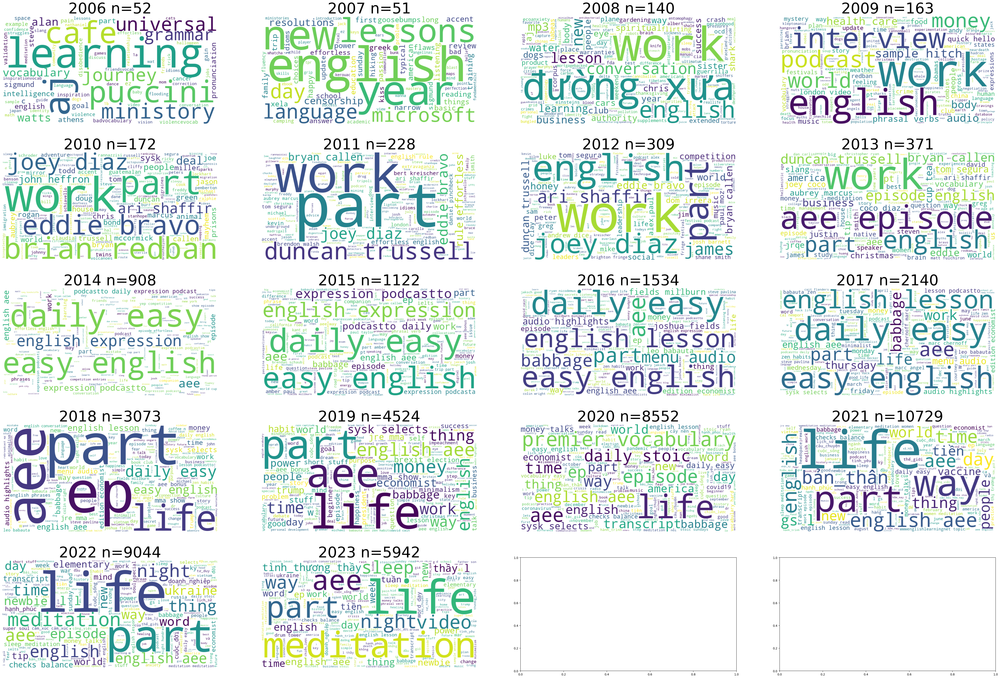

In [11]:
wordclouds = {}

# Loop through each year and extract the top words for each year
for year in grouped_df.index:
    text = grouped_df.loc[year, 'tokenized_name']
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    wordclouds[year] = wordcloud

# Plot the word clouds
fig, axes = plt.subplots(5, 4, figsize=(60, 40))
axes = axes.flatten()
for i, year in enumerate(wordclouds.keys()):
    # Plot the word cloud for the given year
    axes[i].imshow(wordclouds[year], interpolation="bilinear")
    axes[i].set_title(f"{year} n={grouped_df.loc[year, 'count']}", size=50)
    axes[i].axis("off")

# Display the plot
plt.show()

In [12]:
grouped_df.head()

,tokenized_name,np_name,count
release_date,,,
2006,cafe puccini ez cafe puccini pain gain mini...,cafe puccini ez cafe_puccini no pain no gain...,52
2007,happy new year american accent training revie...,happy new_year american accent_training_revie...,51
2008,habeas corpus works plane crash flirting wor...,how habeas_corpus_works how flirting_works ...,140
2009,brian redban brian redban human experimentat...,brian_redban brian_redban how human_experime...,163
2010,hal sparks john heffron joey diaz russell p...,hal_sparks john_heffron joey_diaz russell_p...,172


In [13]:
#print out the frequency of the words in the above word cloud
from collections import Counter

for year in grouped_df.index:
    text = grouped_df.loc[year, 'np_name']
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    wordclouds[year] = wordcloud
    print(f"Year: {year}")
    print(Counter(text.split()).most_common(50))
    print("\n")

Year: 2006
[('no', 2), ('storytelling', 2), ('why', 2), ('remaining', 2), ('walden', 2), ('alan', 2), ('watts', 2), ('cafe', 1), ('puccini', 1), ('ez', 1), ('cafe_puccini', 1), ('pain', 1), ('gain', 1), ('our_universal_journey', 1), ('our', 1), ('universal_journey', 1), ('ministory_example', 1), ('validation', 1), ('disobedience', 1), ('incurable', 1), ('cancer', 1), ('worthy', 1), ('goals', 1), ('need_space', 1), ('grammar_is_bad', 1), ('grammar_is_badvocabulary', 1), ('violence', 1), ('violencevocab', 1), ('inspiration', 1), ('inspirationvocab', 1), ('friends', 1), ('friendsvocab', 1), ('vocabulary', 1), ('intelligence', 1), ('intelligence_vocabulary', 1), ('how', 1), ('to', 1), ('pay', 1), ('nathaniel', 1), ('in_japan_correction', 1), ('the', 1), ('effortless_english_vision', 1), ('meditation', 1), ('for_language_learning', 1), ('treat', 1), ('what', 1), ('is_halloween', 1), ('flooding', 1), ('change', 1), ('your_goal', 1)]


Year: 2007
[('day', 2), ('xela', 2), ('microsoft', 2), ('

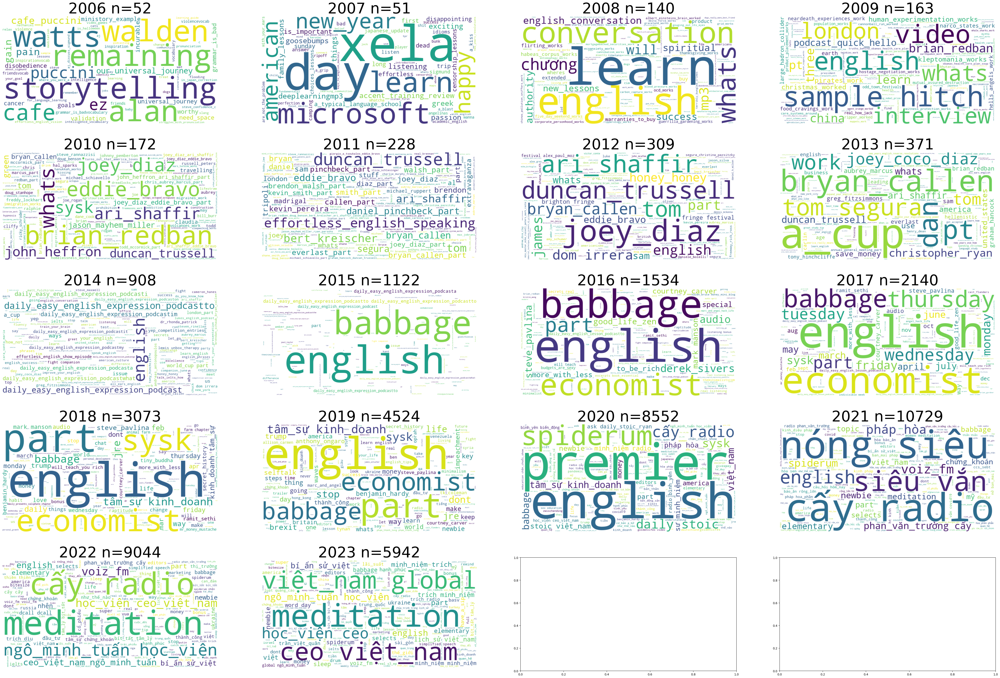

In [14]:
wordclouds = {}

# Loop through each year and extract the top words for each year
for year in grouped_df.index:
    text = grouped_df.loc[year, 'np_name']
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    wordclouds[year] = wordcloud

# Plot the word clouds
fig, axes = plt.subplots(5, 4, figsize=(60, 40))
axes = axes.flatten()
for i, year in enumerate(wordclouds.keys()):
    # Plot the word cloud for the given year
    axes[i].imshow(wordclouds[year], interpolation="bilinear")
    axes[i].set_title(f"{year} n={grouped_df.loc[year, 'count']}", size=50)
    axes[i].axis("off")

# Display the plot
plt.show()